In [1]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve

# BoW

In [2]:
data= pd.read_csv('Quora.csv')
#data= data.sample(frac=0.1, random_state=10)
data


,question_text,target
0,Why most guys take advantage of nice girls in ...,1
1,How might Donald Trump be worse than the worst...,1
2,Do humans have more smart answers to dumb ques...,0
3,"Why Woody Allen makes allusions to Nietzsche, ...",0
4,What accounts for the fact that in our streets...,0
...,...,...
9995,I've read from websites about guys that women ...,1
9996,How do I seduce my aunt?,1
9997,If you register to donate your organs upon you...,0
9998,How do I quit being Chinese?,1


In [3]:
data.dropna(inplace=True)

In [4]:
data['target'].value_counts(normalize=True)


1    0.5
0    0.5
Name: target, dtype: float64

In [5]:
X_train, X_test, y_train, y_test = train_test_split(data['question_text'],data['target'],random_state=0,test_size=0.2)


In [6]:
print('X_train first entry:\n\n', X_train.iloc[0])
print('\n\nX_train shape: ', X_train.shape)

X_train first entry:

 Why is there double standard when it comes to sexism? Women are more likely to be acknowledged as victims of sexism when they faced it than men do.


X_train shape:  (8000,)


In [7]:
vect = CountVectorizer().fit(X_train)
vect

CountVectorizer()

In [8]:
vect.get_feature_names_out()[::100]

array(['00', '2016', '50000', 'abode', 'acoustics', 'advertisement',
       'airframe', 'alumni', 'animal', 'apple', 'arrow', 'astronomy',
       'avoid', 'bananas', 'bearing', 'beyond', 'blackes', 'boner',
       'brazil', 'buddha', 'calcite', 'carry', 'centipede', 'chelsea',
       'circumcised', 'cls550', 'column', 'composite', 'consciously',
       'conventions', 'counterintelligence', 'criticism', 'curvature',
       'dc', 'degree', 'derogatorily', 'dialogue', 'discredited',
       'diwali', 'downvote', 'dur', 'educator', 'emf', 'entrants',
       'evade', 'expecting', 'factor', 'fck', 'filipinos', 'fluid',
       'fragmentation', 'fur', 'genocide', 'goats', 'greatest', 'habitat',
       'harmony', 'herdsmen', 'holoucast', 'hugs', 'idf', 'implicit',
       'indie', 'innocent', 'intermeshed', 'irked', 'javascript',
       'judges', 'ketokir', 'korea', 'latin', 'leopardstown', 'link',
       'louder', 'maharashtrian', 'marathis', 'mcgucken', 'mercedes',
       'million', 'modeled', 

In [9]:
len(vect.get_feature_names_out())

13586

In [10]:
X_train_vectorized = vect.transform(X_train)

X_train_vectorized


<8000x13586 sparse matrix of type '<class 'numpy.int64'>'
	with 107155 stored elements in Compressed Sparse Row format>

In [11]:
X_train_vectorized[0]

<1x13586 sparse matrix of type '<class 'numpy.int64'>'
	with 24 stored elements in Compressed Sparse Row format>

In [12]:
model = LogisticRegression()
model.fit(X_train_vectorized, y_train)
predictions1 = model.predict(vect.transform(X_test))
auc1= roc_auc_score(y_test, predictions1)
print('AUC: ', auc1)

AUC:  0.8376274196199157


C:\ProgramData\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [13]:
feature_names = np.array(vect.get_feature_names_out())
sorted_coef_index = model.coef_[0].argsort()
print('Smallest Coefs:\n{}\n'.format(feature_names[sorted_coef_index[:10]]))
print('Largest Coefs: \n{}'.format(feature_names[sorted_coef_index[:-11:-1]]))

Smallest Coefs:
['what' 'change' 'verbal' 'dating' '2017' 'friends' 'stay' 'possible'
 'mumbai' 'successful']

Largest Coefs: 
['liberals' 'atheists' 'girls' 'white' 'women' 'muslims' 'incest' 'obama'
 'chinese' 'israel']


# Tfidf

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer
vect = TfidfVectorizer(min_df=5).fit(X_train)
len(vect.get_feature_names_out())

2506

In [15]:
X_train_vectorized = vect.transform(X_train)

model = LogisticRegression()
model.fit(X_train_vectorized, y_train)

predictions2 = model.predict(vect.transform(X_test))
auc2= roc_auc_score(y_test, predictions2)
print('AUC: ', auc2)

AUC:  0.8349267049075846


In [16]:
feature_names = np.array(vect.get_feature_names_out())

sorted_tfidf_index = X_train_vectorized.max(0).toarray()[0].argsort()

print('Smallest tfidf:\n{}\n'.format(feature_names[sorted_tfidf_index[:10]]))
print('Largest tfidf: \n{}'.format(feature_names[sorted_tfidf_index[:-11:-1]]))

Smallest tfidf:
['wanting' 'streets' 'potentially' 'governments' 'several' 'cant' 'fine'
 'entire' 'unless' 'shy']

Largest tfidf: 
['are' 'sir' 'nepal' 'is' 'which' 'gay' 'lord' 'dying' 'greece' 'com']


In [17]:
sorted_coef_index = model.coef_[0].argsort()

print('Smallest Coefs:\n{}\n'.format(feature_names[sorted_coef_index[:10]]))
print('Largest Coefs: \n{}'.format(feature_names[sorted_coef_index[:-11:-1]]))

Smallest Coefs:
['what' 'how' 'which' 'possible' 'in' 'you' 'can' 'best' '2017' 'one']

Largest Coefs: 
['women' 'trump' 'girls' 'muslims' 'white' 'indians' 'liberals' 'chinese'
 'quora' 'muslim']


# Frequencies 

In [18]:
import nltk
from os import getcwd

In [19]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Μαρίνα\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [20]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Μαρίνα\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [21]:
from utils1 import process_tweet, build_freqs

In [22]:
df= pd.read_csv('Quora.csv')
df

,question_text,target
0,Why most guys take advantage of nice girls in ...,1
1,How might Donald Trump be worse than the worst...,1
2,Do humans have more smart answers to dumb ques...,0
3,"Why Woody Allen makes allusions to Nietzsche, ...",0
4,What accounts for the fact that in our streets...,0
...,...,...
9995,I've read from websites about guys that women ...,1
9996,How do I seduce my aunt?,1
9997,If you register to donate your organs upon you...,0
9998,How do I quit being Chinese?,1


In [23]:
all_positive_tweets = df[df['target']==1]['question_text'].tolist()
all_negative_tweets = df[df['target']==0]['question_text'].tolist()

test_pos = all_positive_tweets[4000:]
train_pos = all_positive_tweets[:4000]
test_neg = all_negative_tweets[4000:]
train_neg = all_negative_tweets[:4000]

train_x = train_pos + train_neg
test_x = test_pos + test_neg

In [24]:
train_y = np.append(np.ones(len(train_pos)), np.zeros(len(train_neg)))
test_y = np.append(np.ones(len(test_pos)), np.zeros(len(test_neg)))

In [25]:
print("train_y.shape = " + str(train_y.shape))
print("test_y.shape = " + str(test_y.shape))

train_y.shape = (8000,)
test_y.shape = (2000,)


In [26]:
freqs = build_freqs(train_x, train_y)

# check the output
print("type(freqs) = " + str(type(freqs)))
print("len(freqs) = " + str(len(freqs.keys())))

type(freqs) = <class 'dict'>
len(freqs) = 13446


In [27]:
print('This is an example of a positive tweet: \n', train_x[0])
print('\nThis is an example of the processed version of the tweet: \n', process_tweet(train_x[0]))

This is an example of a positive tweet: 
 Why most guys take advantage of nice girls in a relationship or even at work?

This is an example of the processed version of the tweet: 
 ['guy', 'take', 'advantag', 'nice', 'girl', 'relationship', 'even', 'work']


In [28]:
def extract_features(tweet, freqs):
    '''
    Input: 
        tweet: a list of words for one tweet
        freqs: a dictionary corresponding to the frequencies of each tuple (word, label)
    Output: 
        x: a feature vector of dimension (1,3)
    '''
    # process_tweet tokenizes, stems, and removes stopwords
    word_l = process_tweet(tweet)
    
    # 3 elements in the form of a 1 x 3 vector
    x = np.zeros((1, 3)) 
    
    #bias term is set to 1
    x[0,0] = 1 
    
    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###
    
    # loop through each word in the list of words
    for word in word_l:
        
        # increment the word count for the positive label 1
        x[0,1] += freqs.get((word, 1.0),0)
        
        # increment the word count for the negative label 0
        x[0,2] += freqs.get((word, 0.0),0)
        
    ### END CODE HERE ###
    assert(x.shape == (1, 3))
    return x

In [29]:
# test on training data
tmp1 = extract_features(train_x[0], freqs)
print(tmp1)

[[  1. 544. 289.]]


In [30]:
X = np.zeros((len(train_x), 3))
for i in range(len(train_x)):
    X[i, :]= extract_features(train_x[i], freqs)

Y = train_y

In [31]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(random_state=0)
clf.fit(X, Y.ravel())

LogisticRegression(random_state=0)

In [32]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [33]:
# collect the features 'x' and stack them into a matrix 'X'
X_te = np.zeros((len(test_x), 3))
for i in range(len(test_x)):
    X_te[i, :]= extract_features(test_x[i], freqs)

# training labels corresponding to X
Y_te = test_y

In [34]:
y_pred = clf.predict(X_te)

accuracy = accuracy_score(Y_te, y_pred)
precision = precision_score(Y_te, y_pred)
recall = recall_score(Y_te, y_pred)
f1 = f1_score(Y_te, y_pred)
auc3= roc_auc_score(Y_te, y_pred)

# Print the results
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print('AUC score:',auc3)

# Optionally, you can print the confusion matrix
conf_matrix = confusion_matrix(Y_te, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.7745
Precision: 0.8327272727272728
Recall: 0.687
F1 Score: 0.7528767123287672
AUC score: 0.7745
Confusion Matrix:
[[862 138]
 [313 687]]


In [35]:
from utils1 import process_tweet, lookup
import pdb
import string

# Naive Bayes

In [36]:
def count_tweets(result, tweets, ys):
    '''
    Input:
        result: a dictionary that will be used to map each pair to its frequency
        tweets: a list of tweets
        ys: a list corresponding to the sentiment of each tweet (either 0 or 1)
    Output:
        result: a dictionary mapping each pair to its frequency
    '''

    for y, tweet in zip(ys, tweets):
        for word in process_tweet(tweet):
              
            pair = (word, y)


            if pair in result:
                result[pair] += 1

            
            else:
                result[pair] = 1

    return result

In [37]:
freqs = count_tweets({}, train_x, train_y)


In [38]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
def train_naive_bayes(freqs, train_x, train_y):
    '''
    Input:
        freqs: dictionary from (word, label) to how often the word appears
        train_x: a list of tweets
        train_y: a list of labels correponding to the tweets (0,1)
    Output:
        logprior: the log prior. (equation 3 above)
        loglikelihood: the log likelihood of you Naive bayes equation. (equation 6 above)
    '''
    loglikelihood = {}
    logprior = 0

    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###

    # calculate V, the number of unique words in the vocabulary
    vocab = set([pair[0] for pair in freqs.keys()])
    V = len(vocab)

    # calculate N_pos and N_neg
    N_pos = N_neg = 0
    for pair in freqs.keys():
        # if the label is positive (greater than zero)
        if pair[1] > 0:

            # Increment the number of positive words by the count for this (word, label) pair
            N_pos += freqs[pair]

        # else, the label is negative
        else:

            # increment the number of negative words by the count for this (word,label) pair
            N_neg += freqs[pair]

    # Calculate D, the number of documents
    D = len(train_y)

    # Calculate D_pos, the number of positive documents (*hint: use sum(<np_array>))
    D_pos = (len(list(filter(lambda x: x > 0, train_y))))

    # Calculate D_neg, the number of negative documents (*hint: compute using D and D_pos)
    D_neg = (len(list(filter(lambda x: x <= 0, train_y))))

    # Calculate logprior
    logprior = np.log(D_pos) - np.log(D_neg)

    # For each word in the vocabulary...
    for word in vocab:
        # get the positive and negative frequency of the word
        freq_pos = lookup(freqs,word,1)
        freq_neg = lookup(freqs,word,0)

        # calculate the probability that each word is positive, and negative
        p_w_pos = (freq_pos + 1) / (N_pos + V)
        p_w_neg = (freq_neg + 1) / (N_neg + V)

        # calculate the log likelihood of the word
        loglikelihood[word] = np.log(p_w_pos/p_w_neg)

    ### END CODE HERE ###

    return logprior, loglikelihood



In [39]:
logprior, loglikelihood = train_naive_bayes(freqs, train_x, train_y)
print(logprior)
print(len(loglikelihood))

0.0
10319


In [40]:
def naive_bayes_predict(tweet, logprior, loglikelihood):
    '''
    Input:
        tweet: a string
        logprior: a number
        loglikelihood: a dictionary of words mapping to numbers
    Output:
        p: the sum of all the logliklihoods of each word in the tweet (if found in the dictionary) + logprior (a number)

    '''
    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###
    # process the tweet to get a list of words
    word_l = process_tweet(tweet)

    # initialize probability to zero
    p = 0

    # add the logprior
    p += logprior

    for word in word_l:

        # check if the word exists in the loglikelihood dictionary
        if word in loglikelihood:
            # add the log likelihood of that word to the probability
            p += loglikelihood[word]

    ### END CODE HERE ###

    return p


In [41]:
def test_naive_bayes(test_x, test_y, logprior, loglikelihood):
    """
    Input:
        test_x: A list of tweets
        test_y: the corresponding labels for the list of tweets
        logprior: the logprior
        loglikelihood: a dictionary with the loglikelihoods for each word
    Output:
        accuracy: (# of tweets classified correctly)/(total # of tweets)
    """
    accuracy = 0  # return this properly

    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###
    y_hats = []
    for tweet in test_x:
        # if the prediction is > 0
        if naive_bayes_predict(tweet, logprior, loglikelihood) > 0:
            # the predicted class is 1
            y_hat_i = 1
        else:
            # otherwise the predicted class is 0
            y_hat_i = 0

        # append the predicted class to the list y_hats
        y_hats.append(y_hat_i)

    # error is the average of the absolute values of the differences between y_hats and test_y
    error = np.mean(np.absolute(y_hats-test_y))

    # Accuracy is 1 minus the error
    accuracy = 1-error

    ### END CODE HERE ###

    return accuracy


print("Naive Bayes accuracy = %0.4f" %
      (test_naive_bayes(test_x, test_y, logprior, loglikelihood)))

Naive Bayes accuracy = 0.8170


In [42]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

def test_naive_bayes(test_x, logprior, loglikelihood):
    """
    Input:
        test_x: A list of tweets
        logprior: the logprior
        loglikelihood: a dictionary with the loglikelihoods for each word
    Output:
        y_scores: the predicted probabilities
    """
    def sigmoid(z):
        return 1 / (1 + np.exp(-z))
    
    y_scores = []
    for tweet in test_x:
        log_probability = naive_bayes_predict(tweet, logprior, loglikelihood)
        probability = sigmoid(log_probability)
        y_scores.append(probability)

    return y_scores

# Χρήση της συνάρτησης για να πάρετε τα y_scores
y_scores_naive_bayes = test_naive_bayes(test_x, logprior, loglikelihood)

# Υπολογισμός του ROC AUC Score χρησιμοποιώντας τα y_scores
roc_auc_naive_bayes = roc_auc_score(test_y, y_scores_naive_bayes)
print(f'ROC AUC Score Naive Bayes: {roc_auc_naive_bayes}')


ROC AUC Score Naive Bayes: 0.8967625


In [43]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

def test_naive_bayes(test_x, logprior, loglikelihood):
    """
    Input:
        test_x: A list of tweets
        logprior: the logprior
        loglikelihood: a dictionary with the loglikelihoods for each word
    Output:
        y_scores: the predicted probabilities
    """
    def sigmoid(z):
        return 1 / (1 + np.exp(-z))
    
    y_scores = []
    for tweet in test_x:
        log_probability = naive_bayes_predict(tweet, logprior, loglikelihood)
        probability = sigmoid(log_probability)
        y_scores.append(probability)

    return y_scores

# Χρήση της συνάρτησης για να πάρετε τα y_scores
y_scores_naive_bayes = test_naive_bayes(test_x, logprior, loglikelihood)

# Υπολογισμός του ROC Curve
fpr4, tpr4, _ = roc_curve(test_y, y_scores_naive_bayes)
auc4 = auc(fpr4, tpr4)
print(f'ROC AUC Naive Bayes: {auc4}')



ROC AUC Naive Bayes: 0.8967625


In [44]:
def get_ratio(freqs, word):
    '''
    Input:
        freqs: dictionary containing the words
        word: string to lookup

    Output: a dictionary with keys 'positive', 'negative', and 'ratio'.
        Example: {'positive': 10, 'negative': 20, 'ratio': 0.5}
    '''
    pos_neg_ratio = {'positive': 0, 'negative': 0, 'ratio': 0.0}
    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###
    # use lookup() to find positive counts for the word (denoted by the integer 1)
    pos_neg_ratio['positive'] = lookup(freqs,word,1)

    # use lookup() to find negative counts for the word (denoted by integer 0)
    pos_neg_ratio['negative'] = lookup(freqs,word,0)

    # calculate the ratio of positive to negative counts for the word
    pos_neg_ratio['ratio'] = (pos_neg_ratio['positive'] + 1)/(pos_neg_ratio['negative'] + 1)
    ### END CODE HERE ###
    return pos_neg_ratio


In [45]:
def get_words_by_threshold(freqs, label, threshold):
    '''
    Input:
        freqs: dictionary of words
        label: 1 for positive, 0 for negative
        threshold: ratio that will be used as the cutoff for including a word in the returned dictionary
    Output:
        word_set: dictionary containing the word and information on its positive count, negative count, and ratio of positive to negative counts.
        example of a key value pair:
        {'happi':
            {'positive': 10, 'negative': 20, 'ratio': 0.5}
        }
    '''
    word_list = {}

    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###
    for key in freqs.keys():
        word, _ = key

        # get the positive/negative ratio for a word
        pos_neg_ratio = get_ratio(freqs, word)

        # if the label is 1 and the ratio is greater than or equal to the threshold...
        if label == 1 and pos_neg_ratio['ratio'] >= threshold:

            # Add the pos_neg_ratio to the dictionary
            word_list[word] = pos_neg_ratio

        # If the label is 0 and the pos_neg_ratio is less than or equal to the threshold...
        elif label == 0 and pos_neg_ratio['ratio'] <= threshold:

            # Add the pos_neg_ratio to the dictionary
            word_list[word] = pos_neg_ratio

        # otherwise, do not include this word in the list (do nothing)

    ### END CODE HERE ###
    return word_list

In [46]:
print('Truth Predicted Tweet')
for x, y in zip(test_x, test_y):
    y_hat = naive_bayes_predict(x, logprior, loglikelihood)
    if y != (np.sign(y_hat) > 0):
        print('%d\t%0.2f\t%s' % (y, np.sign(y_hat) > 0, ' '.join(
            process_tweet(x)).encode('ascii', 'ignore')))

Truth Predicted Tweet
1	0.00	b'new yorker defens'
1	0.00	b'abort right support think fetal brain use cpu comput technolog permit'
1	0.00	b'wtc build 1 2 7 actual come near free-fal acceler 9/11 signific differ compar precis freefal'
1	0.00	b'cross spider human possibl'
1	0.00	b' buy 420 onlin best cannabi keyword far'
1	0.00	b'peopl want earn money join team distributor work'
1	0.00	b'best rifl mass murder'
1	0.00	b'would put chloroform humidifi notic affect help sleep night'
1	0.00	b'technolog nasa use guard world circumpass antarcti stop peopl drive fast snow scooter far fall edg world'
1	0.00	b'intp find intj narrow-mind'
1	0.00	b'fast would peni spin take like helicopt'
1	0.00	b'true nehru childhood day migrat nepal sell panipuri'
1	0.00	b'akshay kumar delet tweet 2012 rise petrol price hypocrisi highest order'
1	0.00	b'way make money fast requir open shop start idea'
1	0.00	b'person scream bite appl'
1	0.00	b'quora becom propaganda tool china profession content churn record time'


# Word Embeddings

In [47]:
import sys
!pip install emoji==1.4.1

Defaulting to user installation because normal site-packages is not writeable


In [48]:
import re
import nltk
from nltk.tokenize import word_tokenize
import emoji
import numpy as np
import itertools

from utils2 import get_dict

In [49]:
def tokenize(corpus):
    df = re.sub(r'[,!?;-]+', '.', corpus)
    df = nltk.word_tokenize(df)  # tokenize string to words
    df = [ ch.lower() for ch in df
             if ch.isalpha()
             or ch == '.'
             or emoji.get_emoji_regexp().search(ch)
           ]
    return df

def get_windows(words, C):
    i = C
    while i < len(words) - C:
        center_word = words[i]
        context_words = words[(i - C):i] + words[(i+1):(i+C+1)]
        yield context_words, center_word
        i += 1

def word_to_one_hot_vector(word, word2Ind, V):
    # BEGIN your code here
    one_hot_vector = np.zeros(V)
    one_hot_vector[word2Ind[word]] = 1
    # END your code here
    return one_hot_vector

def context_words_to_vector(context_words, word2Ind, V):
    # BEGIN your code here
    context_words_vectors = [word_to_one_hot_vector(w, word2Ind, V) for w in context_words]
    context_words_vectors = np.mean(context_words_vectors, axis=0)
    # END your code here
    return context_words_vectors

def get_training_example(words, C, word2Ind, V):
    for context_words, center_word in get_windows(words, C):
        yield context_words_to_vector(context_words, word2Ind, V), word_to_one_hot_vector(center_word, word2Ind, V)
        
def relu(z):
    # BEGIN your code here
    result = z.copy()
    result[result < 0] = 0
    # END your code here
    
    return result

def softmax(z):
    # BEGIN your code here
    e_z = np.exp(z)
    sum_e_z = np.sum(e_z)
    return e_z / sum_e_z

In [50]:
df= pd.read_csv('Quora.csv')

In [51]:
list_of_texts = df['question_text'].to_list()


In [52]:
list_of_tokenized_texts = [tokenize(tweet) for tweet in list_of_texts]

In [53]:
list_of_tokens = list(itertools.chain(*list_of_tokenized_texts))

In [54]:
word2Ind, Ind2word = get_dict(list_of_tokens)
V =len(word2Ind)
print("Size of vocabulary: ", V)

Size of vocabulary:  14699


In [55]:
N=3 

W1= np.random.uniform(-1,1,(N,V))
W2= np.random.uniform(-1,1,(V,N))
b1= np.random.uniform(-1,1,(N,1))
b2= np.random.uniform(-1,1,(V,1))

In [56]:
alpha = 0.03
for epoch in range(5):
    for sentence in list_of_tokenized_texts:
        training_examples = get_training_example(sentence, 2, word2Ind, V)
        for x_array, y_array in training_examples:
            x = x_array.copy()
            x.shape = (V,1)
            
            y = y_array.copy()
            y.shape = (V,1)
            
            z1= np.dot(W1,x) + b1
            h = relu(z1)
            
            z2= np.dot(W2,h) + b2
            y_hat = softmax(z2)
            
            grad_b2= y_hat - y 
            grad_W2= np.dot(grad_b2, h.T)
            grad_b1 = relu(np.dot(W2.T, grad_b2))
            grad_W1 = np.dot(grad_b1, x.T)
            
            W1 = W1 - alpha * grad_W1
            W2 = W2 - alpha * grad_W2
            b1 = b1 - alpha * grad_b1
            b2 = b2 - alpha * grad_b2
            

In [57]:
W3= (W1+W2.T)/2

In [58]:
list_of_embeddings= []
for token in list_of_tokens:
    word_embedding_vector = W3[:,word2Ind[token]]
    print(f"Token:{token}, embeddings: {word_embedding_vector}")
    list_of_embeddings.append(word_embedding_vector)
list_of_embeddings= np.array(list_of_embeddings)

Token:why, embeddings: [-20.69605476 -17.47026152 -16.42929118]
Token:most, embeddings: [-3.15891808 -4.49375864 -3.73757706]
Token:guys, embeddings: [-1.00522068 -1.59179406 -1.38568723]
Token:take, embeddings: [-2.18103436 -2.23490713 -2.25997878]
Token:advantage, embeddings: [-0.42705725 -0.33160486  0.36427473]
Token:of, embeddings: [-37.78794213 -45.75619949 -39.71200826]
Token:nice, embeddings: [-0.70861385  0.45317422 -1.1511936 ]
Token:girls, embeddings: [-2.93017673 -2.29619595 -2.23968253]
Token:in, embeddings: [-39.36076139 -42.01268625 -38.60795916]
Token:a, embeddings: [-47.29637921 -48.19568178 -47.16528129]
Token:relationship, embeddings: [-0.63429139  0.27450341 -0.39860162]
Token:or, embeddings: [-13.01095048 -12.7781085  -11.48070958]
Token:even, embeddings: [-2.47955811 -2.3897576  -2.92634259]
Token:at, embeddings: [-6.1296623  -5.67620866 -4.69422896]
Token:work, embeddings: [-1.91301163 -2.10114202 -2.72933102]
Token:., embeddings: [-143.27296232 -138.44585501 -13

In [59]:
sentence_embeddings= list_of_embeddings.mean(axis=0)
sentence_embeddings

array([-25.84272759, -25.52200698, -24.04364138])

In [60]:
df['embeddings']= df['question_text'].apply(lambda x: W3[:,[word2Ind[i] for i in tokenize(str(x))]].T.mean(axis=0))
expanded_df= pd.DataFrame(df['embeddings'].to_list(),columns=[f"embedding_{i}" for i in range(N)])
df= pd.concat([df, expanded_df],axis=1).drop('embeddings',axis=1)
df

,question_text,target,embedding_0,embedding_1,embedding_2
0,Why most guys take advantage of nice girls in ...,1,-20.187037,-20.315405,-19.152121
1,How might Donald Trump be worse than the worst...,1,-18.788009,-18.270587,-17.710560
2,Do humans have more smart answers to dumb ques...,0,-28.461404,-27.012194,-25.524867
3,"Why Woody Allen makes allusions to Nietzsche, ...",0,-30.964126,-30.361042,-28.466202
4,What accounts for the fact that in our streets...,0,-24.936306,-24.864078,-23.269428
...,...,...,...,...,...
9995,I've read from websites about guys that women ...,1,-19.938920,-19.425135,-18.002423
9996,How do I seduce my aunt?,1,-30.975002,-28.737024,-28.716016
9997,If you register to donate your organs upon you...,0,-25.602691,-25.082833,-23.611920
9998,How do I quit being Chinese?,1,-29.861461,-27.926812,-27.578733


In [61]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

features = df.drop(['target', 'question_text'], axis=1)  
target = df['target']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')


Accuracy: 0.621


In [62]:
from sklearn.metrics import roc_auc_score
y_proba = model.predict_proba(X_test)[:, 1]

auc5 = roc_auc_score(y_test, y_proba)
print(f'ROC AUC Score: {auc5}')




ROC AUC Score: 0.6772129349409937


# RNN

In [64]:
import pandas as pd
import re
import nltk
from nltk import word_tokenize
import emoji
import numpy as np
import itertools
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

dataframe= pd.read_csv('Quora.csv')
dataframe.dropna(inplace=True)
dataframe['target']= dataframe['target'].replace({1:True,0:False})
dataframe.head()

,question_text,target
0,Why most guys take advantage of nice girls in ...,True
1,How might Donald Trump be worse than the worst...,True
2,Do humans have more smart answers to dumb ques...,False
3,"Why Woody Allen makes allusions to Nietzsche, ...",False
4,What accounts for the fact that in our streets...,False


In [65]:
data= dataframe['question_text'].map(word_tokenize).values
data[:2]

array([list(['Why', 'most', 'guys', 'take', 'advantage', 'of', 'nice', 'girls', 'in', 'a', 'relationship', 'or', 'even', 'at', 'work', '?']),
       list(['How', 'might', 'Donald', 'Trump', 'be', 'worse', 'than', 'the', 'worst', 'person', 'that', 'most', 'people', 'have', 'ever', 'known', '?'])],
      dtype=object)

In [66]:
total_vocabulary= set(word.lower() for text in data for word in text)
list(total_vocabulary)[:2]

['comey', 'oath']

In [67]:
print(len(total_vocabulary))

16232


In [68]:
!pip install tensorflow
!pip install --upgrade tensorflow


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [69]:
!pip install keras_preprocessing

Defaulting to user installation because normal site-packages is not writeable


In [70]:
from keras_preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, LSTM, Embedding, SimpleRNN, GRU
from keras.models import Sequential
from keras import initializers, regularizers, constraints, optimizers, layers
from keras_preprocessing import text, sequence
import tensorflow as tf


y= df['target'].values

tokenizer= text.Tokenizer(num_words=10000)
tokenizer.fit_on_texts(list(df['question_text']))
tokenized_texts= tokenizer.texts_to_sequences(df['question_text'])

X=sequence.pad_sequences(tokenized_texts,maxlen=100)

In [71]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import GlobalMaxPool1D, Dropout

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

model = Sequential()
embedding_size = 128
model.add(Embedding(len(total_vocabulary), embedding_size))
model.add(LSTM(25, return_sequences=True))
model.add(GlobalMaxPool1D())
model.add(Dropout(0.5))
model.add(Dense(50, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(50, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

In [72]:
model.compile(loss='binary_crossentropy', 
              optimizer='adam', 
              metrics=['accuracy'])
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 128)         2077696   
                                                                 
 lstm (LSTM)                 (None, None, 25)          15400     
                                                                 
 global_max_pooling1d (Glob  (None, 25)                0         
 alMaxPooling1D)                                                 
                                                                 
 dropout (Dropout)           (None, 25)                0         
                                                                 
 dense (Dense)               (None, 50)                1300      
                                                                 
 dropout_1 (Dropout)         (None, 50)                0         
                                                       

In [73]:
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10


225/225 [==============================] - 21s 74ms/step - loss: 0.5691 - accuracy: 0.7053 - val_loss: 0.3703 - val_accuracy: 0.8475
Epoch 2/10
225/225 [==============================] - 15s 64ms/step - loss: 0.3498 - accuracy: 0.8739 - val_loss: 0.3368 - val_accuracy: 0.8525
Epoch 3/10
225/225 [==============================] - 12s 51ms/step - loss: 0.2183 - accuracy: 0.9294 - val_loss: 0.4110 - val_accuracy: 0.8550
Epoch 4/10
225/225 [==============================] - 11s 51ms/step - loss: 0.1459 - accuracy: 0.9536 - val_loss: 0.4881 - val_accuracy: 0.8413
Epoch 5/10
225/225 [==============================] - 11s 51ms/step - loss: 0.1142 - accuracy: 0.9636 - val_loss: 0.5505 - val_accuracy: 0.8388
Epoch 6/10
225/225 [==============================] - 12s 51ms/step - loss: 0.0863 - accuracy: 0.9711 - val_loss: 0.6986 - val_accuracy: 0.8388
Epoch 7/10
225/225 [==============================] - 11s 51ms/step - loss: 0.0588 - accuracy: 0.9808 - val_loss: 0.8236 - val_accurac

In [74]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
import numpy as np
y_pred = model.predict(X_test).flatten()
y_pred = (y_pred > 0.5).astype(int)

auc6 = roc_auc_score(y_test, y_pred)

print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"AUC Score: {auc6:.2f}")

63/63 [==============================] - 1s 13ms/step
Accuracy: 0.7935
AUC: 0.7943535476434427


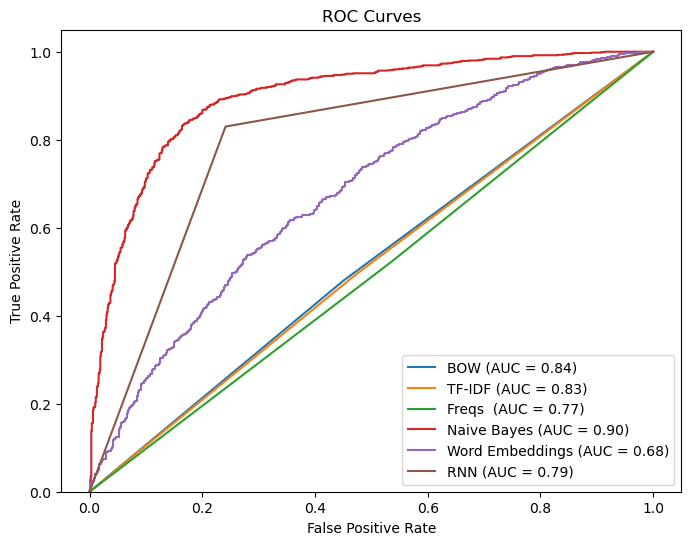

In [75]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr1, tpr1, _ = roc_curve(y_test, predictions1)
fpr2, tpr2, _ = roc_curve(y_test, predictions2)
fpr3, tpr3, _ = roc_curve(Y_te, y_pred)
fpr4, tpr4, _ = roc_curve(test_y, y_scores_naive_bayes)
fpr5, tpr5, _ = roc_curve(y_test, y_proba)
fpr6, tpr6, _ = roc_curve(y_test, y_pred)

plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, label=f'BOW (AUC = {auc1:.2f})')
plt.plot(fpr2, tpr2, label=f'TF-IDF (AUC = {auc2:.2f})')
plt.plot(fpr3, tpr3, label=f'Freqs  (AUC = {auc3:.2f})')
plt.plot(fpr4, tpr4, label=f'Naive Bayes (AUC = {auc4:.2f})')
plt.plot(fpr5, tpr5, label=f'Word Embeddings (AUC = {auc5:.2f})')
plt.plot(fpr6, tpr6, label=f'RNN (AUC = {auc6:.2f})')
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc="lower right")
plt.show()
